# Multi Cancer IPYNB

In [1]:
import os

root_dir = '/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Multi Cancer'  # Change this to your dataset path

for foldername, subfolders, filenames in os.walk(root_dir):
    print(f'Found folder: {foldername}')
    for subfolder in subfolders:
        print(f'  Subfolder: {subfolder}')
    for filename in filenames:
        print(f'  File: {filename}')
    print('-' * 40)


Found folder: /Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Multi Cancer
  Subfolder: Oral Cancer
  Subfolder: Brain Cancer
  Subfolder: ALL
  Subfolder: Lymphoma
  Subfolder: Kidney Cancer
  Subfolder: Cervical Cancer
  Subfolder: Lung and Colon Cancer
  Subfolder: Breast Cancer
  File: .DS_Store
----------------------------------------
Found folder: /Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Multi Cancer/Oral Cancer
  Subfolder: oral_scc
  Subfolder: oral_normal
  File: .DS_Store
----------------------------------------
Found folder: /Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Multi Cancer/Oral Cancer/oral_scc
  File: oral_scc_4906.jpg
  File: oral_scc_4912.jpg
  File: oral_scc_3933.jpg
  File: oral_scc_4084.jpg
  File: oral_scc_2393.jpg
  File: oral_scc_1842.jpg
  File: oral_scc_0584.jpg
  File: oral_scc_1856.jpg
  File: oral_scc_0590.jpg
  File: oral_scc_3099.jpg
  File: oral_scc_2387.jpg
  File: oral_scc_3927.jpg
  File: oral

In [2]:
import os

def print_folders_tree(start_path, indent=""):
    for item in os.listdir(start_path):
        path = os.path.join(start_path, item)
        if os.path.isdir(path):
            print(f"{indent}📂 {item}")
            print_folders_tree(path, indent + "    ")



print_folders_tree('/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Multi Cancer')


📂 Oral Cancer
    📂 oral_scc
    📂 oral_normal
📂 Brain Cancer
    📂 brain_menin
    📂 brain_tumor
    📂 brain_glioma
📂 ALL
    📂 all_benign
    📂 all_pre
    📂 all_early
    📂 all_pro
📂 Lymphoma
    📂 lymph_mcl
    📂 lymph_cll
    📂 lymph_fl
📂 Kidney Cancer
    📂 kidney_tumor
    📂 kidney_normal
📂 Cervical Cancer
    📂 cervix_sfi
    📂 cervix_dyk
    📂 cervix_mep
    📂 cervix_pab
    📂 cervix_koc
📂 Lung and Colon Cancer
    📂 lung_aca
    📂 lung_bnt
    📂 colon_aca
    📂 colon_bnt
    📂 lung_scc
📂 Breast Cancer
    📂 breast_benign
    📂 breast_malignant


In [3]:
import os
import shutil

# Set your source dataset root and the new target directory
SOURCE_ROOT = '/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Multi Cancer'
TARGET_ROOT = '/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset'  # e.g., '/Users/yourname/MasterDataset'

# Create the target directory if it doesn't exist
os.makedirs(TARGET_ROOT, exist_ok=True)

for cancer_type in os.listdir(SOURCE_ROOT):
    cancer_type_path = os.path.join(SOURCE_ROOT, cancer_type)
    if not os.path.isdir(cancer_type_path):
        continue

    # Skip the "ALL" folder
    if cancer_type.lower() == "all":
        continue

    # For each subtype in the cancer type folder
    for subtype in os.listdir(cancer_type_path):
        subtype_path = os.path.join(cancer_type_path, subtype)
        if not os.path.isdir(subtype_path):
            continue

        # Create target folder for this subtype/class
        target_subtype_folder = os.path.join(TARGET_ROOT, subtype)
        os.makedirs(target_subtype_folder, exist_ok=True)

        # Copy all files from subtype folder to the new location
        for filename in os.listdir(subtype_path):
            src_file = os.path.join(subtype_path, filename)
            dst_file = os.path.join(target_subtype_folder, filename)
            if os.path.isfile(src_file):
                shutil.copy2(src_file, dst_file)

print("✅ Dataset has been restructured and copied to:", TARGET_ROOT)


✅ Dataset has been restructured and copied to: /Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset


In [4]:
import os
import plotly.graph_objects as go

# Path to your MasterDataset folder
dataset_dir = '/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset'

class_counts = {}
for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):
        num_files = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts[class_name] = num_files

# Sort classes alphabetically for better visualization
sorted_classes = sorted(class_counts.items(), key=lambda x: x[0])
labels = [item[0] for item in sorted_classes]
counts = [item[1] for item in sorted_classes]

fig = go.Figure([go.Bar(x=labels, y=counts)])
fig.update_layout(
    title='Class Distribution in MasterDataset',
    xaxis_title='Class (Subtype)',
    yaxis_title='Number of Images',
    xaxis_tickangle=-45,
    template='plotly_white'
)
fig.show()


# Dataset Splitting and Model Training

In [2]:
import os
import tensorflow as tf

data_dir = "/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset"

batch_size = 32
img_height = 224
img_width = 224
seed = 123

# No output_dir or subfolders required

train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,   
    subset="training",
    seed=seed,
    image_size=(img_height, img_width),
    batch_size=batch_size, 
    label_mode="categorical"
)

val_test_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=seed,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode="categorical"
)

# Further split val_test_ds into val and test (in memory, no folders)
val_test_ds = val_test_ds.unbatch()
val_test_ds = val_test_ds.shuffle(1000, seed=seed)

val_test_count = sum(1 for _ in val_test_ds)
val_count = test_count = val_test_count // 2

val_ds = val_test_ds.take(val_count).batch(batch_size)
test_ds = val_test_ds.skip(val_count).batch(batch_size)


Found 110002 files belonging to 22 classes.
Using 88002 files for training.
Found 110002 files belonging to 22 classes.
Using 22000 files for validation.


In [2]:
print(train_ds.class_names)

['brain_glioma', 'brain_menin', 'brain_tumor', 'breast_benign', 'breast_malignant', 'cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi', 'colon_aca', 'colon_bnt', 'kidney_normal', 'kidney_tumor', 'lung_aca', 'lung_bnt', 'lung_scc', 'lymph_cll', 'lymph_fl', 'lymph_mcl', 'oral_normal', 'oral_scc']


### Simple Data Augmentation 

In [6]:
import tensorflow as tf

# Data Augmentation Pipeline (Keras Sequential API)
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.25),      # 0.25 ≈ ±90 degrees
    tf.keras.layers.RandomZoom(0.1),           # ±10%
    tf.keras.layers.RandomContrast(0.15),      # ±15% contrast for stain variation
    tf.keras.layers.RandomBrightness(0.1),     # ±10% brightness for lighting/staining
])

# Example: Apply augmentation to batches from train_ds
augmented_train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

# Prefetch for performance
augmented_train_ds = augmented_train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)


## Model Training

### EfficientNet B0

In [7]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import (
    Dense, GlobalAveragePooling2D, GlobalMaxPooling2D,
    Dropout, BatchNormalization, Activation, Concatenate
)
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

# Load EfficientNetB3 base model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze all but the last 50 layers
for layer in base_model.layers[:-50]:
    layer.trainable = False
for layer in base_model.layers[-50:]:
    layer.trainable = True

# Robust classifier head
gap = GlobalAveragePooling2D()(base_model.output)
gmp = GlobalMaxPooling2D()(base_model.output)
combined_pool = Concatenate()([gap, gmp])
combined_pool = BatchNormalization()(combined_pool)

x = Dense(512, kernel_regularizer=l2(0.001))(combined_pool)
x = Activation('swish')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(256, kernel_regularizer=l2(0.001))(x)
x = Activation('swish')(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

x = Dense(128, kernel_regularizer=l2(0.001))(x)
x = Activation('swish')(x)
x = BatchNormalization()(x)

# Change the number of classes here if needed!
preds = Dense(22, activation='softmax')(x)  # output layer for 12 classes

Cancer_B0 = Model(inputs=base_model.input, outputs=preds)

Cancer_B0.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

Cancer_B0.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 5,541,689 (21.14 MB)

 Trainable params: 4,012,070 (15.30 MB)

 Non-trainable params: 1,529,619 (5.84 MB)

In [8]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

epochs = 40  # Safe to use a larger number due to early stopping
optimizer = Adam(learning_rate=0.0001)

check_point = ModelCheckpoint(
    filepath='/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/EfficientB0/Checkpoints/EfficientNetB0-{epoch:02d}-{val_categorical_accuracy:.2f}.h5',
    monitor="val_categorical_accuracy",
    mode="max",
    save_best_only=True
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=7,  # a bit more patience for EfficientNetB3
    mode='auto',
    restore_best_weights=True,  # restore best weights for best model performance
    start_from_epoch=0
)

Cancer_B0.compile(
    loss='categorical_crossentropy',
    optimizer=optimizer,
    metrics=['categorical_accuracy']
)

Cancer_B0_History = Cancer_B0.fit(
    augmented_train_ds,                # use your augmented dataset!
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[early_stopping, check_point]
)


Epoch 1/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 803ms/step - categorical_accuracy: 0.6296 - loss: 2.4942

2025-06-16 19:11:36.078393: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/Users/saikeerthan/NYP-AI/Year3/new_y3s1/lib/python3.11/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



2751/2751 ━━━━━━━━━━━━━━━━━━━━ 2385s 862ms/step - categorical_accuracy: 0.6296 - loss: 2.4940 - val_categorical_accuracy: 0.9023 - val_loss: 1.4127
Epoch 2/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 634ms/step - categorical_accuracy: 0.8886 - loss: 1.3527

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1893s 688ms/step - categorical_accuracy: 0.8886 - loss: 1.3527 - val_categorical_accuracy: 0.9307 - val_loss: 1.0004
Epoch 3/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 668ms/step - categorical_accuracy: 0.9176 - loss: 0.9656

2025-06-16 20:16:25.373884: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1997s 726ms/step - categorical_accuracy: 0.9176 - loss: 0.9656 - val_categorical_accuracy: 0.9466 - val_loss: 0.7055
Epoch 4/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 677ms/step - categorical_accuracy: 0.9331 - loss: 0.6995

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 2029s 737ms/step - categorical_accuracy: 0.9331 - loss: 0.6995 - val_categorical_accuracy: 0.9531 - val_loss: 0.5219
Epoch 5/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - categorical_accuracy: 0.9497 - loss: 0.5124

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 2106s 765ms/step - categorical_accuracy: 0.9497 - loss: 0.5124 - val_categorical_accuracy: 0.9693 - val_loss: 0.3744
Epoch 6/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 3630s 1s/step - categorical_accuracy: 0.9564 - loss: 0.4006 - val_categorical_accuracy: 0.9619 - val_loss: 0.3342
Epoch 7/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1961s 712ms/step - categorical_accuracy: 0.9598 - loss: 0.3305 - val_categorical_accuracy: 0.9676 - val_loss: 0.2753
Epoch 8/40


2025-06-16 22:58:30.527140: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 613ms/step - categorical_accuracy: 0.9640 - loss: 0.2755

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1827s 664ms/step - categorical_accuracy: 0.9640 - loss: 0.2755 - val_categorical_accuracy: 0.9782 - val_loss: 0.2107
Epoch 9/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1770s 643ms/step - categorical_accuracy: 0.9666 - loss: 0.2431 - val_categorical_accuracy: 0.9678 - val_loss: 0.2150
Epoch 10/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1794s 652ms/step - categorical_accuracy: 0.9683 - loss: 0.2153 - val_categorical_accuracy: 0.9760 - val_loss: 0.1755
Epoch 11/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1785s 649ms/step - categorical_accuracy: 0.9721 - loss: 0.1859 - val_categorical_accuracy: 0.9723 - val_loss: 0.1757
Epoch 12/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 600ms/step - categorical_accuracy: 0.9741 - loss: 0.1709

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1797s 653ms/step - categorical_accuracy: 0.9741 - loss: 0.1709 - val_categorical_accuracy: 0.9815 - val_loss: 0.1342
Epoch 13/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 598ms/step - categorical_accuracy: 0.9765 - loss: 0.1538

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1783s 648ms/step - categorical_accuracy: 0.9765 - loss: 0.1538 - val_categorical_accuracy: 0.9868 - val_loss: 0.1195
Epoch 14/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1766s 642ms/step - categorical_accuracy: 0.9783 - loss: 0.1405 - val_categorical_accuracy: 0.9823 - val_loss: 0.1246
Epoch 15/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 587ms/step - categorical_accuracy: 0.9805 - loss: 0.1296

2025-06-17 02:56:25.234193: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1752s 637ms/step - categorical_accuracy: 0.9805 - loss: 0.1296 - val_categorical_accuracy: 0.9876 - val_loss: 0.1013
Epoch 16/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1741s 633ms/step - categorical_accuracy: 0.9810 - loss: 0.1217 - val_categorical_accuracy: 0.9857 - val_loss: 0.1047
Epoch 17/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1752s 637ms/step - categorical_accuracy: 0.9836 - loss: 0.1145 - val_categorical_accuracy: 0.9809 - val_loss: 0.1198
Epoch 18/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1741s 633ms/step - categorical_accuracy: 0.9839 - loss: 0.1102 - val_categorical_accuracy: 0.9807 - val_loss: 0.1152
Epoch 19/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 573ms/step - categorical_accuracy: 0.9842 - loss: 0.1060

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1711s 622ms/step - categorical_accuracy: 0.9842 - loss: 0.1060 - val_categorical_accuracy: 0.9880 - val_loss: 0.0903
Epoch 20/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - categorical_accuracy: 0.9854 - loss: 0.1013

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1707s 620ms/step - categorical_accuracy: 0.9854 - loss: 0.1013 - val_categorical_accuracy: 0.9926 - val_loss: 0.0774
Epoch 21/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1697s 617ms/step - categorical_accuracy: 0.9863 - loss: 0.0957 - val_categorical_accuracy: 0.9863 - val_loss: 0.0912
Epoch 22/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1691s 615ms/step - categorical_accuracy: 0.9868 - loss: 0.0928 - val_categorical_accuracy: 0.9868 - val_loss: 0.0863
Epoch 23/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1695s 616ms/step - categorical_accuracy: 0.9882 - loss: 0.0875 - val_categorical_accuracy: 0.9862 - val_loss: 0.0919
Epoch 24/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1691s 614ms/step - categorical_accuracy: 0.9882 - loss: 0.0876 - val_categorical_accuracy: 0.9903 - val_loss: 0.0789
Epoch 25/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1686s 613ms/step - categorical_accuracy: 0.9880 - loss: 0.0856 - val_categorical_accuracy: 0.9843 - val_loss: 0.0993
Epoch 26/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1674s 608

2025-06-17 10:32:09.299004: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1723s 626ms/step - categorical_accuracy: 0.9904 - loss: 0.0724 - val_categorical_accuracy: 0.9882 - val_loss: 0.0842
Epoch 33/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1734s 630ms/step - categorical_accuracy: 0.9911 - loss: 0.0726 - val_categorical_accuracy: 0.9893 - val_loss: 0.0758
Epoch 34/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1768s 642ms/step - categorical_accuracy: 0.9908 - loss: 0.0734 - val_categorical_accuracy: 0.9846 - val_loss: 0.0921
Epoch 35/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 596ms/step - categorical_accuracy: 0.9907 - loss: 0.0704

2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1780s 647ms/step - categorical_accuracy: 0.9907 - loss: 0.0704 - val_categorical_accuracy: 0.9946 - val_loss: 0.0610
Epoch 36/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1794s 652ms/step - categorical_accuracy: 0.9918 - loss: 0.0685 - val_categorical_accuracy: 0.9925 - val_loss: 0.0703
Epoch 37/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1822s 662ms/step - categorical_accuracy: 0.9912 - loss: 0.0692 - val_categorical_accuracy: 0.9913 - val_loss: 0.0680
Epoch 38/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 2986s 1s/step - categorical_accuracy: 0.9919 - loss: 0.0675 - val_categorical_accuracy: 0.9920 - val_loss: 0.0641
Epoch 39/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 3092s 1s/step - categorical_accuracy: 0.9925 - loss: 0.0646 - val_categorical_accuracy: 0.9934 - val_loss: 0.0604
Epoch 40/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 2526s 918ms/step - categorical_accuracy: 0.9922 - loss: 0.0639 - val_categorical_accuracy: 0.9885 - val_loss: 0.0816


In [10]:
test_loss, test_acc = Cancer_B0.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.4f} | Test loss: {test_loss:.4f}")


344/344 ━━━━━━━━━━━━━━━━━━━━ 150s 421ms/step - categorical_accuracy: 0.9929 - loss: 0.0568
Test accuracy: 0.9936 | Test loss: 0.0549


/Users/saikeerthan/NYP-AI/Year3/new_y3s1/lib/python3.11/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



In [11]:
#save the efficient net model 

Cancer_B0.save("/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/EfficientB0/Efficient_Cancer.keras")

### print out the graphs and the classification report

In [15]:
import plotly.graph_objects as go

# Grab history data
acc = Cancer_B0_History.history['categorical_accuracy']
val_acc = Cancer_B0_History.history['val_categorical_accuracy']
loss = Cancer_B0_History.history['loss']
val_loss = Cancer_B0_History.history['val_loss']
epochs = list(range(1, len(acc) + 1))

# Accuracy plot
fig_acc = go.Figure()
fig_acc.add_trace(go.Scatter(x=epochs, y=acc, mode='lines+markers', name='Train Accuracy'))
fig_acc.add_trace(go.Scatter(x=epochs, y=val_acc, mode='lines+markers', name='Val Accuracy'))
fig_acc.update_layout(
    title='Model Accuracy',
    xaxis_title='Epoch',
    yaxis_title='Categorical Accuracy',
    template='plotly_white'
)
fig_acc.show()

# Loss plot
fig_loss = go.Figure()
fig_loss.add_trace(go.Scatter(x=epochs, y=loss, mode='lines+markers', name='Train Loss'))
fig_loss.add_trace(go.Scatter(x=epochs, y=val_loss, mode='lines+markers', name='Val Loss'))
fig_loss.update_layout(
    title='Model Loss',
    xaxis_title='Epoch',
    yaxis_title='Loss',
    template='plotly_white'
)
fig_loss.show()


### Print out Classification Report & Confusion Matrix

In [17]:
import numpy as np

# Get all true labels and predicted labels from the test set
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = Cancer_B0.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [18]:
from sklearn.metrics import classification_report

# If you have class names, pass them as 'target_names'
print(classification_report(y_true, y_pred, digits=4))


              precision    recall  f1-score   support

           0     0.9981    0.9961    0.9971       518
           1     1.0000    0.9712    0.9854       520
           2     0.9683    1.0000    0.9839       489
           3     0.9925    0.9962    0.9943       528
           4     0.9980    0.9920    0.9950       502
           5     1.0000    1.0000    1.0000       503
           6     1.0000    0.9958    0.9979       479
           7     1.0000    1.0000    1.0000       492
           8     1.0000    1.0000    1.0000       497
           9     1.0000    1.0000    1.0000       495
          10     1.0000    1.0000    1.0000       520
          11     1.0000    1.0000    1.0000       511
          12     0.9980    1.0000    0.9990       508
          13     1.0000    0.9980    0.9990       500
          14     1.0000    0.9980    0.9990       495
          15     1.0000    1.0000    1.0000       503
          16     0.9980    1.0000    0.9990       508
          17     0.9977    

In [19]:
from sklearn.metrics import confusion_matrix
import plotly.figure_factory as ff

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)
# If you have class names, use them; else use indices
class_names = list(train_ds.class_names)  # Or supply your own class names

# Plotly heatmap
fig = ff.create_annotated_heatmap(
    z=cm,
    x=class_names,
    y=class_names,
    colorscale='Blues',
    showscale=True,
    annotation_text=cm,  # Display numbers
)
fig.update_layout(
    title="Confusion Matrix",
    xaxis_title="Predicted",
    yaxis_title="Actual"
)
fig.show()


### Plot ROC-AUC Curve

In [3]:
from tensorflow.keras.models import load_model
Cancer_B0 = load_model('/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/EfficientB0/Efficient_Cancer.keras')

/Users/saikeerthan/NYP-AI/Year3/new_y3s1/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 63 variables whereas the saved optimizer has 124 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [5]:
import numpy as np
from sklearn.preprocessing import label_binarize

# Extract predictions and true labels from test_ds
y_true = []
y_score = []

for images, labels in test_ds:
    preds = Cancer_B0.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_score = np.array(y_score)

# Binarize y_true for multi-class ROC AUC
y_true = label_binarize(y_true, classes=list(range(22)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

2025-06-19 22:46:03.354179: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [6]:
import plotly.graph_objects as go
import plotly.express as px
from sklearn.metrics import roc_curve, auc
import numpy as np
from itertools import cycle

n_classes = y_score.shape[1]

# Compute FPR, TPR, AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC
fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Start Plotly figure
fig = go.Figure()

# Colors
colors = cycle(px.colors.qualitative.Dark24)  # 22 distinct colors

# Add class-wise ROC curves
for i, color in zip(range(n_classes), colors):
    fig.add_trace(go.Scatter(
        x=fpr[i],
        y=tpr[i],
        mode='lines',
        name=f'Class {i} (AUC = {roc_auc[i]:.2f})',
        line=dict(color=color)
    ))

# Add micro-average
fig.add_trace(go.Scatter(
    x=fpr["micro"],
    y=tpr["micro"],
    mode='lines',
    name=f'Micro-average (AUC = {roc_auc["micro"]:.2f})',
    line=dict(color='deeppink', dash='dot')
))

# Add macro-average
fig.add_trace(go.Scatter(
    x=fpr["macro"],
    y=tpr["macro"],
    mode='lines',
    name=f'Macro-average (AUC = {roc_auc["macro"]:.2f})',
    line=dict(color='navy', dash='dot')
))

# Add diagonal reference line
fig.add_trace(go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    name='Chance',
    line=dict(color='gray', dash='dash')
))

# Layout
fig.update_layout(
    title='Multi-Class ROC Curve (EfficientNet Model)',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    legend_title='Classes',
    width=1000,
    height=700
)

fig.show()


### Use Grad-CAM to show what features of the pictures influence the Model's Predictions, used for clinical trust

In [7]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Create a model that maps the input image to the activations and prediction
    grad_model = tf.keras.models.Model(
        [model.inputs], 
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Record operations for automatic differentiation
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    # Compute gradients of the top predicted class wrt conv layer outputs
    grads = tape.gradient(class_channel, conv_outputs)

    # Global average pooling on the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel by corresponding gradient importance
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    return heatmap.numpy()

In [17]:
class_names = list(train_ds.class_names) 

In [18]:
def display_gradcam_multiple_with_predictions(image_paths, model, class_names, last_conv_layer_name='top_conv'):
    plt.figure(figsize=(14, 10))

    for i, img_path in enumerate(image_paths):
        # Load and preprocess image
        img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)

        # Get predictions
        preds = model.predict(img_array, verbose=0)[0]
        pred_index = np.argmax(preds)
        pred_label = class_names[pred_index]
        confidence = preds[pred_index] * 100

        # Generate Grad-CAM heatmap
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index)

        # Load original image in RGB
        img_orig = cv2.imread(img_path)
        img_orig = cv2.resize(img_orig, (224, 224))
        img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)

        # Resize and color-map the heatmap
        heatmap_resized = cv2.resize(heatmap, (224, 224))
        heatmap_rescaled = np.uint8(255 * heatmap_resized)
        heatmap_color = cv2.applyColorMap(heatmap_rescaled, cv2.COLORMAP_JET)
        heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

        # Superimpose heatmap
        superimposed_img = cv2.addWeighted(img_rgb, 0.6, heatmap_color, 0.4, 0)

        # Plot original image
        plt.subplot(3, 2, 2 * i + 1)
        plt.imshow(img_rgb)
        plt.title(f"Original Image {i+1}\nPredicted: {pred_label}\nConfidence: {confidence:.2f}%")
        plt.axis('off')

        # Plot Grad-CAM
        plt.subplot(3, 2, 2 * i + 2)
        plt.imshow(superimposed_img)
        plt.title(f"Grad-CAM Image {i+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


/Users/saikeerthan/NYP-AI/Year3/new_y3s1/lib/python3.11/site-packages/keras/src/models/functional.py:241: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))



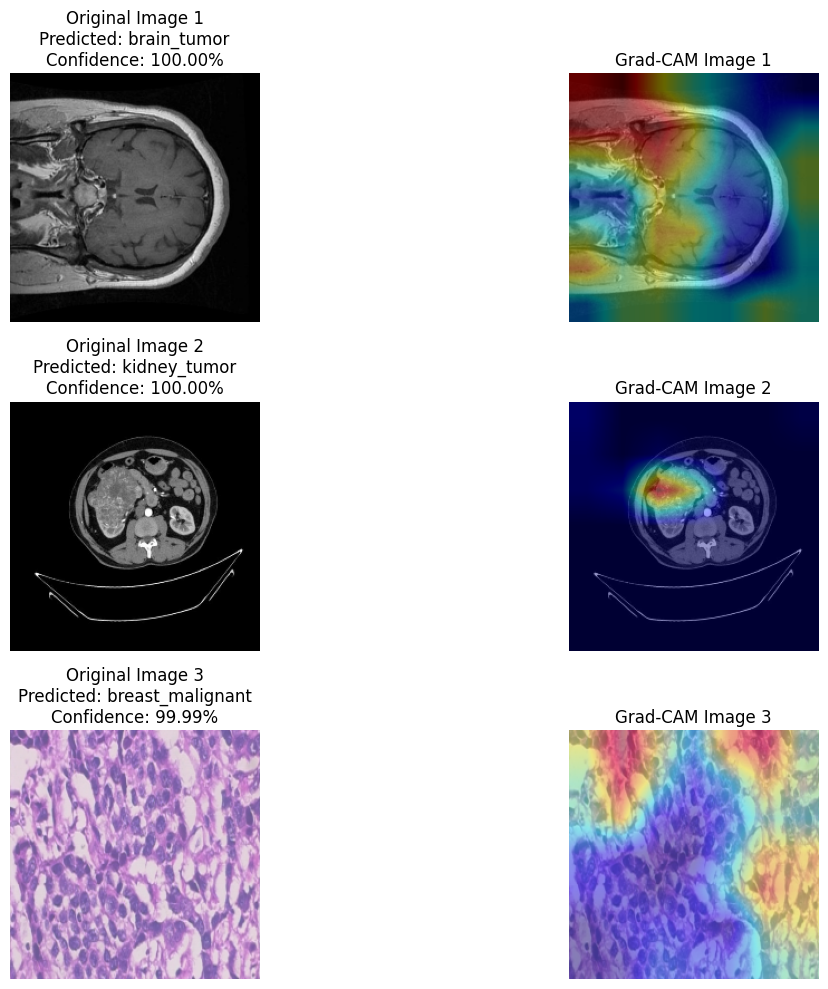

In [20]:
image_paths = [
    "/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset/brain_tumor/brain_tumor_4998.jpg",
    "/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset/kidney_tumor/kidney_tumor_0006.jpg",
    "/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset/breast_malignant/breast_malignant_0010.jpg"
]

display_gradcam_multiple_with_predictions(image_paths, model=Cancer_B0, class_names=class_names)


In [1]:
import tensorflow as tf

# Load your keras model
model = tf.keras.models.load_model("/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/EfficientB0/Efficient_Cancer.keras")

# Convert to TFLite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TFLite model
with open("model.tflite", "wb") as f:
    f.write(tflite_model)

/Users/saikeerthan/NYP-AI/Year3/new_y3s1/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 63 variables whereas the saved optimizer has 124 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


INFO:tensorflow:Assets written to: /var/folders/wv/lgt7rwvx5dn_v1y74zftwswh0000gn/T/tmpx9a9it1u/assets


INFO:tensorflow:Assets written to: /var/folders/wv/lgt7rwvx5dn_v1y74zftwswh0000gn/T/tmpx9a9it1u/assets


Saved artifact at '/var/folders/wv/lgt7rwvx5dn_v1y74zftwswh0000gn/T/tmpx9a9it1u'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 22), dtype=tf.float32, name=None)
Captures:
  12920575696: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  12920570896: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  12917215440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  12917215248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  12917216208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  12917215824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  12917216592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  12917216016: TensorSpec(shape=(), dtype=tf.resource, name=None)
  12917217936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  12917218512: TensorSpec(shape=(), dtype=tf.resource, nam

W0000 00:00:1750431924.410587  412092 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1750431924.411388  412092 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
2025-06-20 20:35:24.412786: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /var/folders/wv/lgt7rwvx5dn_v1y74zftwswh0000gn/T/tmpx9a9it1u
2025-06-20 20:35:24.422175: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2025-06-20 20:35:24.422188: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: /var/folders/wv/lgt7rwvx5dn_v1y74zftwswh0000gn/T/tmpx9a9it1u
I0000 00:00:1750431924.521820  412092 mlir_graph_optimization_pass.cc:425] MLIR V1 optimization pass is not enabled
2025-06-20 20:35:24.540236: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2025-06-20 20:35:25.136018: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: /var/folder

### Test on legit Test Set

In [1]:
import os

# Path to your training dataset or master dataset with subfolders as class names
dataset_path = "/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset"  # Replace with your actual path

# List class folder names (sorted for consistent order)
class_names = sorted([
    folder_name for folder_name in os.listdir(dataset_path)
    if os.path.isdir(os.path.join(dataset_path, folder_name))
])

print("Class names:", class_names)


Class names: ['brain_glioma', 'brain_menin', 'brain_tumor', 'breast_benign', 'breast_malignant', 'cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi', 'colon_aca', 'colon_bnt', 'kidney_normal', 'kidney_tumor', 'lung_aca', 'lung_bnt', 'lung_scc', 'lymph_cll', 'lymph_fl', 'lymph_mcl', 'oral_normal', 'oral_scc']


In [ ]:
# MODEL_PATH = '/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/EfficientB0/Efficient_Cancer.keras'
# IMAGE_SIZE = (224, 224)
# CLASS_NAMES = ['brain_glioma', 'brain_menin', 'brain_tumor', 'breast_benign', 'breast_malignant', 'cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi', 'colon_aca', 'colon_bnt', 'kidney_normal', 'kidney_tumor', 'lung_aca', 'lung_bnt', 'lung_scc', 'lymph_cll', 'lymph_fl', 'lymph_mcl', 'oral_normal', 'oral_scc']

In [7]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input
import plotly.graph_objects as go
import plotly.subplots as sp
from PIL import Image

# Load your trained EfficientNet model
model = tf.keras.models.load_model("/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/EfficientB0/Efficient_Cancer.keras")  # 🔁 Replace with your model path

# Get class names from your training set
data_dir = "/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset"
img_height, img_width = 224, 224
batch_size = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode="categorical"
)

class_names = train_ds.class_names

# Choose number of samples per class
num_images_per_class = 1
images, titles = [], []

for class_name in class_names:
    class_dir = os.path.join(data_dir, class_name)
    image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    sample_files = np.random.choice(image_files, min(num_images_per_class, len(image_files)), replace=False)

    for fname in sample_files:
        img_path = os.path.join(class_dir, fname)
        img = image.load_img(img_path, target_size=(img_height, img_width))
        img_arr = image.img_to_array(img)
        input_arr = np.expand_dims(preprocess_input(img_arr), axis=0)

        pred = model.predict(input_arr)
        pred_idx = np.argmax(pred)
        pred_class = class_names[pred_idx]
        confidence = pred[0][pred_idx] * 100

        images.append(np.array(img).astype('uint8'))
        titles.append(f"True: {class_name}<br>Pred: {pred_class} ({confidence:.2f}%)")

# Plot using Plotly
cols = 4
rows = int(np.ceil(len(images) / cols))
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=titles)

for i, img in enumerate(images):
    row = i // cols + 1
    col = i % cols + 1
    fig.add_trace(go.Image(z=img), row=row, col=col)

fig.update_layout(
    height=300 * rows,
    width=300 * cols,
    title_text="EfficientNet Predictions Grid",
    showlegend=False
)
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)

fig.show()


Found 110002 files belonging to 22 classes.
Using 88002 files for training.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


In [8]:
# import tensorflow as tf
# import numpy as np
# import matplotlib.pyplot as plt
# import os
# from tensorflow.keras.preprocessing import image
# from tensorflow.keras.applications.efficientnet import preprocess_input

# # Load your trained EfficientNet model
# model = tf.keras.models.load_model("/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/EfficientB0/Efficient_Cancer.keras")  # Update with actual path

# # Rebuild train_ds to get the correct class order
# data_dir = "/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/TrainableDataset"
# train_ds = tf.keras.utils.image_dataset_from_directory(
#     data_dir,
#     validation_split=0.2,
#     subset="training",
#     seed=123,
#     image_size=(224, 224),
#     batch_size=32,
#     label_mode="categorical"
# )

# # Get class names in the correct label order
# class_names = train_ds.class_names
# print("Class names:", class_names)

# # Testing: Load random samples from each class subfolder
# num_images_per_class = 2
# img_height, img_width = 224, 224

# for class_name in class_names:
#     class_dir = os.path.join(data_dir, class_name)
#     if not os.path.isdir(class_dir):
#         continue

#     print(f"\nTesting samples from class: {class_name}")

#     image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
#     sample_files = np.random.choice(image_files, size=min(num_images_per_class, len(image_files)), replace=False)

#     for fname in sample_files:
#         img_path = os.path.join(class_dir, fname)
#         img = image.load_img(img_path, target_size=(img_height, img_width))
#         img_array = image.img_to_array(img)
#         img_array = np.expand_dims(img_array, axis=0)
#         img_array = preprocess_input(img_array)

#         predictions = model.predict(img_array)
#         predicted_index = np.argmax(predictions)
#         predicted_class = class_names[predicted_index]

#         confidence_score = predictions[0][predicted_index] * 100  # Convert to percentage
#         print(f"True: {class_name} | Predicted: {predicted_class} | Confidence: {confidence_score:.2f}%")

#         # Show result
#         plt.imshow(np.array(img).astype('uint8'))
#         plt.title(f"True: {class_name}\nPred: {predicted_class} ({confidence_score:.2f}%)")
#         plt.axis('off')
#         plt.show()



## MobileNetV3 Small

In [20]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.layers import (
    Dense, GlobalAveragePooling2D, GlobalMaxPooling2D,
    Dropout, BatchNormalization, Activation, Concatenate
)
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

# Change ONLY the base model
base_model = MobileNetV3Small(
    weights='imagenet', 
    include_top=False, 
    input_shape=(224, 224, 3)
)

# Freeze layers as you did before (if desired)
for layer in base_model.layers[:-50]:
    layer.trainable = False
for layer in base_model.layers[-50:]:
    layer.trainable = True

gap = GlobalAveragePooling2D()(base_model.output)
gmp = GlobalMaxPooling2D()(base_model.output)
combined_pool = Concatenate()([gap, gmp])
combined_pool = BatchNormalization()(combined_pool)

x = Dense(512, kernel_regularizer=l2(0.001))(combined_pool)
x = Activation('swish')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(256, kernel_regularizer=l2(0.001))(x)
x = Activation('swish')(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

x = Dense(128, kernel_regularizer=l2(0.001))(x)
x = Activation('swish')(x)
x = BatchNormalization()(x)

# Use your number of classes here!
preds = Dense(22, activation='softmax')(x)

Cancer_V3Small = Model(inputs=base_model.input, outputs=preds)


In [21]:
Cancer_V3Small.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv (Conv2D)       │ (None, 112, 112,  │        432 │ rescaling_2[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_bn             │ (None, 112, 112,  │         64 │ conv[0][0]        │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 112, 112,  │          0 │ conv_bn[0][0]     │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 113, 113,  │          0 │ activation_3[0][… │
│ (ZeroPadding2D)     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 56, 56,    │        144 │ expanded_conv_de… │
│ (DepthwiseConv2D)   │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 56, 56,    │         64 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 56, 56,    │          0 │ expanded_conv_de… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │          0 │ re_lu[0][0]       │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │        136 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │          0 │ expanded_conv_sq… │
│ (ReLU)              │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │        144 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 1, 1, 16)  │          0 │ expanded_conv_sq… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 1, 1, 16)  │          0 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 1, 1, 16)  │          0 │ re_lu_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 56, 56,    │          0 │ re_lu[0][0],      │
│ (Multiply)          │ 16)               │            │ multiply[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 56, 56,    │        256 │ expanded_conv_sq

 Total params: 1,704,710 (6.50 MB)

 Trainable params: 1,498,078 (5.71 MB)

 Non-trainable params: 206,632 (807.16 KB)

In [23]:

Cancer_V3Small.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

# Fitting code (reuse your train_ds, val_ds, augmented_train_ds, callbacks, etc.)
Cancer_V3Small_history = Cancer_V3Small.fit(
    augmented_train_ds,
    validation_data=val_ds,
    epochs=40,
    callbacks=[early_stopping, check_point]
)

Epoch 1/40


2751/2751 ━━━━━━━━━━━━━━━━━━━━ 700s 252ms/step - categorical_accuracy: 0.6026 - loss: 2.4313 - val_categorical_accuracy: 0.8990 - val_loss: 1.2920
Epoch 2/40


/Users/saikeerthan/NYP-AI/Year3/new_y3s1/lib/python3.11/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



2751/2751 ━━━━━━━━━━━━━━━━━━━━ 794s 288ms/step - categorical_accuracy: 0.8871 - loss: 1.2758 - val_categorical_accuracy: 0.9213 - val_loss: 0.9823
Epoch 3/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 763s 277ms/step - categorical_accuracy: 0.9182 - loss: 0.9319 - val_categorical_accuracy: 0.9371 - val_loss: 0.7164
Epoch 4/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 791s 287ms/step - categorical_accuracy: 0.9392 - loss: 0.6737 - val_categorical_accuracy: 0.9468 - val_loss: 0.5435
Epoch 5/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 737s 268ms/step - categorical_accuracy: 0.9504 - loss: 0.5020 - val_categorical_accuracy: 0.9580 - val_loss: 0.4098
Epoch 6/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 702s 255ms/step - categorical_accuracy: 0.9579 - loss: 0.3906 - val_categorical_accuracy: 0.9631 - val_loss: 0.3289
Epoch 7/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 701s 255ms/step - categorical_accuracy: 0.9653 - loss: 0.3037 - val_categorical_accuracy: 0.9621 - val_loss: 0.2805
Epoch 8/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 709s 258ms/step - cat

2025-06-17 20:57:00.170515: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


2751/2751 ━━━━━━━━━━━━━━━━━━━━ 695s 252ms/step - categorical_accuracy: 0.9881 - loss: 0.0740 - val_categorical_accuracy: 0.9853 - val_loss: 0.0803
Epoch 23/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1044s 379ms/step - categorical_accuracy: 0.9905 - loss: 0.0656 - val_categorical_accuracy: 0.9885 - val_loss: 0.0674
Epoch 24/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1160s 421ms/step - categorical_accuracy: 0.9901 - loss: 0.0678 - val_categorical_accuracy: 0.9805 - val_loss: 0.0972
Epoch 25/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 857s 311ms/step - categorical_accuracy: 0.9900 - loss: 0.0638 - val_categorical_accuracy: 0.9860 - val_loss: 0.0777
Epoch 26/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1140s 414ms/step - categorical_accuracy: 0.9906 - loss: 0.0639 - val_categorical_accuracy: 0.9785 - val_loss: 0.1051
Epoch 27/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 719s 261ms/step - categorical_accuracy: 0.9918 - loss: 0.0582 - val_categorical_accuracy: 0.9883 - val_loss: 0.0661
Epoch 28/40
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 677s 246ms/s

In [24]:
test_loss, test_acc = Cancer_V3Small.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.4f} | Test loss: {test_loss:.4f}")

344/344 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - categorical_accuracy: 0.9888 - loss: 0.0645
Test accuracy: 0.9891 | Test loss: 0.0628


/Users/saikeerthan/NYP-AI/Year3/new_y3s1/lib/python3.11/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



In [25]:
# save the MobileNetV3Small Model
Cancer_V3Small.save("/Users/saikeerthan/NYP-AI/Year3/AI_Application/Cancer_Project3/Model_Files/V3Small/V3Small_Cancer.keras")

In [26]:
import plotly.graph_objects as go

# Grab history data
acc = Cancer_V3Small_history.history['categorical_accuracy']
val_acc = Cancer_V3Small_history.history['val_categorical_accuracy']
loss = Cancer_V3Small_history.history['loss']
val_loss = Cancer_V3Small_history.history['val_loss']
epochs = list(range(1, len(acc) + 1))

# Accuracy plot
fig_acc = go.Figure()
fig_acc.add_trace(go.Scatter(x=epochs, y=acc, mode='lines+markers', name='Train Accuracy'))
fig_acc.add_trace(go.Scatter(x=epochs, y=val_acc, mode='lines+markers', name='Val Accuracy'))
fig_acc.update_layout(
    title='Model Accuracy',
    xaxis_title='Epoch',
    yaxis_title='Categorical Accuracy',
    template='plotly_white'
)
fig_acc.show()

# Loss plot
fig_loss = go.Figure()
fig_loss.add_trace(go.Scatter(x=epochs, y=loss, mode='lines+markers', name='Train Loss'))
fig_loss.add_trace(go.Scatter(x=epochs, y=val_loss, mode='lines+markers', name='Val Loss'))
fig_loss.update_layout(
    title='Model Loss',
    xaxis_title='Epoch',
    yaxis_title='Loss',
    template='plotly_white'
)
fig_loss.show()


In [30]:
import numpy as np

# Get all true labels and predicted labels from the test set
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = Cancer_V3Small.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step

In [31]:
from sklearn.metrics import classification_report

# If you have class names, pass them as 'target_names'
print(classification_report(y_true, y_pred, digits=4))


              precision    recall  f1-score   support

           0     1.0000    0.9763    0.9880       507
           1     0.9790    0.9923    0.9856       517
           2     0.9898    1.0000    0.9949       487
           3     0.9943    1.0000    0.9972       526
           4     1.0000    0.9980    0.9990       505
           5     0.9980    0.9980    0.9980       508
           6     1.0000    0.9960    0.9980       496
           7     1.0000    0.9980    0.9990       489
           8     1.0000    1.0000    1.0000       501
           9     0.9940    1.0000    0.9970       500
          10     1.0000    1.0000    1.0000       526
          11     1.0000    1.0000    1.0000       510
          12     0.9845    1.0000    0.9922       507
          13     1.0000    0.9842    0.9920       506
          14     1.0000    0.9757    0.9877       493
          15     1.0000    1.0000    1.0000       494
          16     0.9773    1.0000    0.9885       516
          17     1.0000    

In [32]:
from sklearn.metrics import confusion_matrix
import plotly.figure_factory as ff

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)
# If you have class names, use them; else use indices
class_names = list(train_ds.class_names)  # Or supply your own class names

# Plotly heatmap
fig = ff.create_annotated_heatmap(
    z=cm,
    x=class_names,
    y=class_names,
    colorscale='Blues',
    showscale=True,
    annotation_text=cm,  # Display numbers
)
fig.update_layout(
    title="V3Small Confusion Matrix",
    xaxis_title="Predicted",
    yaxis_title="Actual"
)
fig.show()
